In [2]:
#pySnowRadar modules
import sys
%matplotlib widget

# from pySnowRadar import SnowRadar
# from pySnowRadar.processing import extract_layers
# from pySnowRadar.algorithms import Wavelet_TN, Peakiness

from msc_thesis_functions import *
del sys.modules['msc_thesis_functions']
from msc_thesis_functions import *

#Community packages
import os
import datetime
import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks
from datetime import datetime, timedelta
from thefuzz import process, fuzz
from scipy.spatial.distance import cdist
from tqdm import tqdm
import h5py
import cmasher as cmr
import xarray as xr
from scipy.stats import linregress
import matplotlib.colors as mcolors
from pyproj import Transformer
from shapely.geometry import Polygon, Point, MultiPoint, LineString
import numpy as np
import shapely
import seaborn as sns
from pyproj import Transformer
transformer = Transformer.from_crs(4326, 3413, always_xy=True)

from matplotlib.cm import ScalarMappable
pd.options.mode.chained_assignment = None  # default='warn'

from matplotlib.colors import LinearSegmentedColormap

ncolors = 256
color_array = plt.get_cmap('Blues')(range(ncolors))
color_array[:,-1] = np.linspace(0.2,1,ncolors)
map_object = LinearSegmentedColormap.from_list(name='Blues_alpha',colors=color_array)
# 
# register this new colormap with matplotlib
# plt.colormaps.register(cmap=map_object)

from pyproj import Transformer
transformer = Transformer.from_crs(4326, 3413, always_xy=True)

from scipy.constants import speed_of_light


import matplotlib.font_manager as font_manager

font_path= '/Users/torka/Library/Fonts/FiraSans-Light.ttf'
font_manager.fontManager.addfont(font_path)
prop = font_manager.FontProperties(fname=font_path)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = prop.get_name()

import geopandas as gpd

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar


In [3]:
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.collections import PatchCollection

def plot_polygon(ax, poly, **kwargs):
    path = Path.make_compound_path(
        Path(np.asarray(poly.exterior.coords)[:, :2]),
        *[Path(np.asarray(ring.coords)[:, :2]) for ring in poly.interiors])

    patch = PathPatch(path, **kwargs)
    collection = PatchCollection([patch], **kwargs)
    
    ax.add_collection(collection, autolim=True)
    ax.autoscale_view()
    return collection

In [5]:
sites = [2, 3, 4, 'grid3', 'grid4', 'grid5', 'grid6', 'grid7', 'grid8']

#opening ATM grids
path_ATM= '/Users/torka/Library/CloudStorage/OneDrive-Personal/MarineSciences/MasterThs-T/Data/OIB/ATM_gridded/gridding_v7'
files = os.listdir(path_ATM)
ATM_data_dict = {}
print('Opening ATM data:')
for site in sites:
    file = [x for x in files if x.split('_')[-1].split('.')[0] == str(site)][0]
    print(f'{site}: {file}')
    ds = xr.open_dataset(os.path.join(path_ATM, file))
    ATM_data_dict[site] = ds
print('------------------')


#opening MP grids
path_MP = '/Users/torka/Library/CloudStorage/OneDrive-Personal/MarineSciences/MasterThs-T/Data/Eureka/krigging_onATMgrid_v5_exactTrue'
files = os.listdir(path_MP)
files = [f for f in files if f.endswith('.nc')] 
MP_data_dict = {}
print('Opening MP data:')
for site in sites:
    file = [x for x in files if x.split('_')[1] == str(site)][0]
    print(f'{site}: {file}')
    ds = xr.open_dataset(os.path.join(path_MP, file))
    MP_data_dict[site] = ds
print('------------------')

#opening SR data (Wavelet)
path_SR_Wavelet = '/Users/torka/Library/CloudStorage/OneDrive-Personal/MarineSciences/MasterThs-T/Data/OIB/Wavelet/20250112'
SR_Wavelet_data_dict = {}
print('Opening SR Wavelet data:')
for site in sites:
    SR_Wavelet_data_dict[site] = {}
    subpath = os.path.join(path_SR_Wavelet, str(site))
    for i, f in enumerate(os.listdir(subpath)):
        print(f'{site}, {i}: {f}')
        ds = xr.open_dataset(os.path.join(path_SR_Wavelet, str(site), f))
        SR_Wavelet_data_dict[site][i] = ds
print('------------------')


#opening SR data (Peakiness)
path_SR_Peakiness = '/Users/torka/Library/CloudStorage/OneDrive-Personal/MarineSciences/MasterThs-T/Data/OIB/Peakiness/20250107'
SR_Peakiness_data_dict = {}
print('Opening SR Peakiness data:')

for site in sites:
    SR_Peakiness_data_dict[site] = {}
    subpath = os.path.join(path_SR_Peakiness, str(site))
    for i, f in enumerate(os.listdir(subpath)):
        print(f'{site}, {i}: {f}')
        ds = xr.open_dataset(os.path.join(path_SR_Peakiness, str(site), f))
        SR_Peakiness_data_dict[site][i] = ds
        
#opening shapefiles
path_shapefiles = '/Users/torka/Library/CloudStorage/OneDrive-Personal/MarineSciences/MasterThs-T/Data/Eureka/grid_extents_v3'
shape_dict = {}
for site in sites:
    file = [x for x in os.listdir(path_shapefiles) if x.split('_')[1] == str(site) and x.endswith('shp')][0]
    print(f'{site}: {file}')
    shape_dict[site] = gpd.read_file(os.path.join(path_shapefiles, file))


Opening ATM data:
2: EUREKA2014_ATM_gridded_2.nc
3: EUREKA2014_ATM_gridded_3.nc
4: EUREKA2014_ATM_gridded_4.nc
grid3: EUREKA2016_ATM_gridded_grid3.nc
grid4: EUREKA2016_ATM_gridded_grid4.nc
grid5: EUREKA2016_ATM_gridded_grid5.nc
grid6: EUREKA2016_ATM_gridded_grid6.nc
grid7: EUREKA2016_ATM_gridded_grid7.nc
grid8: EUREKA2016_ATM_gridded_grid8.nc
------------------
Opening MP data:
2: EUREKA2014_2_krigged_MP_snow_depth.nc
3: EUREKA2014_3_krigged_MP_snow_depth.nc
4: EUREKA2014_4_krigged_MP_snow_depth.nc
grid3: EUREKA2016_grid3_krigged_MP_snow_depth.nc
grid4: EUREKA2016_grid4_krigged_MP_snow_depth.nc
grid5: EUREKA2016_grid5_krigged_MP_snow_depth.nc
grid6: EUREKA2016_grid6_krigged_MP_snow_depth.nc
grid7: EUREKA2016_grid7_krigged_MP_snow_depth.nc
grid8: EUREKA2016_grid8_krigged_MP_snow_depth.nc
------------------
Opening SR Wavelet data:
2, 0: IRSNO1B_20140325_02_175_deconv.nc
2, 1: IRSNO1B_20140325_02_229_deconv.nc
2, 2: IRSNO1B_20140325_02_208_deconv.nc
2, 3: IRSNO1B_20140325_02_125_deconv.n

In [6]:
df_master_dict = {}
df_tmp_dict = {}

for site in tqdm(sites):
    df_tmp_dict[site] = {}
    
    for i in SR_Wavelet_data_dict[site].keys():

        ds =  SR_Wavelet_data_dict[site][i]
        df_tmp = SR_Wavelet_data_dict[site][i].to_dataframe().loc[0]
        df_tmp_tmp = SR_Peakiness_data_dict[site][i].to_dataframe().loc[0]
        df_tmp['air_snow_elevation_peakiness'] = df_tmp_tmp['air_snow_elevation']
        df_tmp['snow_ice_elevation_peakiness'] = df_tmp_tmp['snow_ice_elevation']
        df_tmp['snow_depth_peakiness'] = df_tmp_tmp['snow_depth']

        df_tmp.reset_index(inplace=True)
        
        #add site, ice age and overflight information
        df_tmp['site'] = [site] * len(df_tmp)    
        df_tmp['ice_age'] = df_tmp['site'].apply(lambda x: 'myi' if x=='grid8' or x=='grid5' else 'fyi') 
        df_tmp['overflight_nr'] = [i] * len(df_tmp) 

        #add footprints
        df_tmp, sr_footprints = construct_footprints_theoretical(df_tmp, ds)
        df_tmp['footprints'] = sr_footprints
        df_tmp['footprint_area'] = df_tmp['footprints'].apply(lambda x: x.area)


        xx, yy = np.meshgrid(ATM_data_dict[site]['easting'], ATM_data_dict[site]['northing'], indexing='xy')
        zz_ATM = ATM_data_dict[site]['elevation'].values.flatten()

        mask = ~np.isnan(zz_ATM)
        xx = xx.flatten()[mask]
        yy = yy.flatten()[mask]

        poly_points_indices_wavelet = points_in_poly_list(df_tmp['footprints'], list(zip(xx, yy)), np.mean(df_tmp['footprint_area']) * .9)
        wavelet_indices = list(poly_points_indices_wavelet.keys())
        df_tmp = df_tmp.loc[wavelet_indices] #delete not fully-covered footprints

        df_tmp['grid_indices'] = poly_points_indices_wavelet
        df_tmp['grid_x'] = df_tmp['grid_indices'].apply(lambda x: xx[x])
        df_tmp['grid_y'] = df_tmp['grid_indices'].apply(lambda x: yy[x])
        df_tmp['grid_dists'] = df_tmp.apply(lambda x: np.sqrt((x.grid_x - x.x)**2 + (x.grid_y - x.y)**2), axis=1)        

        # add ATM 
        df_tmp['ATM_elev'] = df_tmp['grid_indices'].apply(lambda x: ATM_data_dict[site]['elevation'].values.flatten()[mask][x])
        df_tmp['ATM_elev_uncertainty'] = df_tmp['grid_indices'].apply(lambda x: ATM_data_dict[site]['standard_deviation'].values.flatten()[mask][x])    
        df_tmp['ATM_htopo'] = df_tmp['ATM_elev'].apply(lambda x: np.quantile(x, .95) - np.quantile(x, .05))
        df_tmp['ATM_slope'] = df_tmp['grid_indices'].apply(lambda x: ATM_data_dict[site]['slope'].values.flatten()[mask][x])
        df_tmp['ATM_roughness'] = df_tmp['grid_indices'].apply(lambda x: ATM_data_dict[site]['roughness'].values.flatten()[mask][x])
        df_tmp['deformation'] = df_tmp['grid_indices'].apply(lambda x: ATM_data_dict[site]['classes'].values.flatten()[mask][x])

        # add MP
        df_tmp['MP_snow_depth'] = df_tmp['grid_indices'].apply(lambda x: MP_data_dict[site]['snow_depth'].values.flatten()[mask][x])
        df_tmp['MP_snow_depth_uncertainty'] = df_tmp['grid_indices'].apply(lambda x: MP_data_dict[site]['snow_depth_uncertainty'].values.flatten()[mask][x])

        offset_wavelet = np.mean(df_tmp['air_snow_elevation'] - df_tmp['ATM_elev'].apply(lambda x: np.quantile(x, .9)))
        offset_peakiness = np.mean(df_tmp['air_snow_elevation_peakiness'] - df_tmp['ATM_elev'].apply(lambda x: np.quantile(x, .5)))
        
        df_tmp['ATM_elev_wavelet'] = df_tmp['ATM_elev'].apply(lambda x: x + offset_wavelet)
        df_tmp['ATM_elev_peakiness'] = df_tmp['ATM_elev'].apply(lambda x: x + offset_peakiness)

        df_tmp = df_tmp.loc[(abs(df_tmp['roll']) < 3) & abs((df_tmp['pitch']) < 3)]
        df_tmp = df_tmp.loc[df_tmp['MP_snow_depth'].apply(lambda x: len(x[~np.isnan(x)]) > 10)]

        df_tmp.reset_index(inplace=True, drop=True)
        if len (df_tmp) > 0:
            df_tmp_dict[site][i] = df_tmp
        
            if i == 0:
                df_master = df_tmp
            else:
                df_master = pd.concat([df_master, df_tmp], axis=0)
            
        df_master.reset_index(inplace=True, drop=True)

    if site == 2:
        df_supermaster = df_master
    else:
        df_supermaster = pd.concat([df_supermaster, df_master], axis=0)
        
    df_supermaster.reset_index(inplace=True, drop=True)
    
    df_master_dict[site] = df_master

100%|██████████| 9/9 [03:04<00:00, 20.53s/it]


In [ ]:
norm = mcolors.Normalize(vmin=0, vmax=.5)
cmap = cmr.arctic
colors =  ["#c25a40", "#9494c1", "#58643d"]

sites_2014 = [2,3,4]
fig, ax = plt.subplots(1,3,figsize=(12,5), constrained_layout=True, dpi=100)   
ax = ax.ravel()

for ind in range(len(ax)):
    ax[ind].set_aspect('equal')
    ax[ind].set_title(sites_2014[ind])
    ax[ind].axis('off')
    
for i, site in enumerate(sites_2014):
    
    
    for fp, k in zip(df_master_dict[site]['footprints'], df_master_dict[site].index):
        plot_polygon(ax[i], fp, edgecolor='black', facecolor=cmap(norm(df_master_dict[site].loc[k,'snow_depth'])), lw=.5, zorder=100, alpha=.5)
        
    for geom in shape_dict[site].geometry:
        if type(geom) == shapely.geometry.multipolygon.MultiPolygon:
            for j, g in enumerate(geom):
                ax[i].plot(g.exterior.xy[0], g.exterior.xy[1], color=colors[i], lw=2, zorder=10)
                            # ax[0].plot(shape_dict[site].geometry[0].geoms[0].exterior.xy[0], shape_dict[site].geometry[0].geoms[0].exterior.xy[1], color='black', lw=1, zorder=100, label='Site boundary')
        else:
                ax[i].plot(geom.exterior.xy[0], geom.exterior.xy[1], color=colors[i], lw=2, zorder=10, label='Site boundary')
                
    xlim = ax[i].get_xlim()
    
    width = xlim[1] - xlim[0]
    ylim = ax[i].get_ylim()
    height = ylim[1] - ylim[0]
    diff = height - width
    if diff > 0:
        ax[i].set_xlim(xlim[0]-diff/2, xlim[1] + diff/2) 
        ax[i].set_ylim(ylim)
    else:
        ax[i].set_xlim(xlim)
        ax[i].set_ylim(ylim[0]-diff/2, ylim[1] + diff/2)
    scalebar = AnchoredSizeBar(ax[i].transData,
                           100, '100 m', 'lower right', 
                        #    pad=1,
                           color='black',
                           frameon=False,
                           fill_bar=True,
                           size_vertical=2,
                           label_top=True,
                           sep=4,
                           fontproperties=font_manager.FontProperties(family='Fira Sans', size=9)
                           )
        
        
    ax[i].add_artist(scalebar)
    
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', label='Snow depth [m]', shrink=.6, extend='max')
cbar.ax.yaxis.set_label_position('left')

In [ ]:
norm = mcolors.Normalize(vmin=0, vmax=1)
cmap = cmr.arctic
colors = ["#90c9b5",
"#8449c1",
"#7ecf5b",
"#ca5390",
"#cdb453","#4e304a",]
sites_2016 = ['grid3','grid4', 'grid5','grid6','grid7','grid8']

fig, ax = plt.subplots(2,3,figsize=(12,8), constrained_layout=True, dpi=100)   
ax = ax.ravel()

for ind in range(len(ax)):
    ax[ind].set_aspect('equal')
    ax[ind].set_title(sites_2016[ind])
    ax[ind].axis('off')
    
for i, site in enumerate(sites_2016):
    
    
    
        
    for geom in shape_dict[site].geometry:
        if type(geom) == shapely.geometry.multipolygon.MultiPolygon:
            for j, g in enumerate(geom):
                ax[i].plot(g.exterior.xy[0], g.exterior.xy[1], color=colors[i], lw=2, zorder=1000)
                            # ax[0].plot(shape_dict[site].geometry[0].geoms[0].exterior.xy[0], shape_dict[site].geometry[0].geoms[0].exterior.xy[1], color='black', lw=1, zorder=100, label='Site boundary')
        else:
                ax[i].plot(geom.exterior.xy[0], geom.exterior.xy[1], color=colors[i], lw=2, zorder=1000, label='Site boundary')
                
    xlim = ax[i].get_xlim()
    
    width = xlim[1] - xlim[0]
    ylim = ax[i].get_ylim()
    height = ylim[1] - ylim[0]
    diff = height - width
    for fp, k in zip(df_master_dict[site]['footprints'], df_master_dict[site].index):
        plot_polygon(ax[i], fp, edgecolor='black', facecolor=cmap(norm(df_master_dict[site].loc[k,'snow_depth'])), lw=.5, zorder=100, alpha=.5)
        
    if diff > 0:
        ax[i].set_xlim(xlim[0]-diff/2, xlim[1] + diff/2) 
        ax[i].set_ylim(ylim)
    else:
        ax[i].set_xlim(xlim)
        ax[i].set_ylim(ylim[0]-diff/2, ylim[1] + diff/2)
        
    scalebar = AnchoredSizeBar(ax[i].transData,
                           100, '100 m', 'lower right', 
                        #    pad=1,
                           color='black',
                           frameon=False,
                           fill_bar=True,
                           size_vertical=2,
                           label_top=True,
                           sep=4,
                           fontproperties=font_manager.FontProperties(family='Fira Sans', size=9)
                           )
        
        
    ax[i].add_artist(scalebar)
    
fig.tight_layout(h_pad=-5, w_pad=4)
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', label='Snow depth [m]', shrink=.4, extend='max')
cbar.ax.yaxis.set_label_position('left')

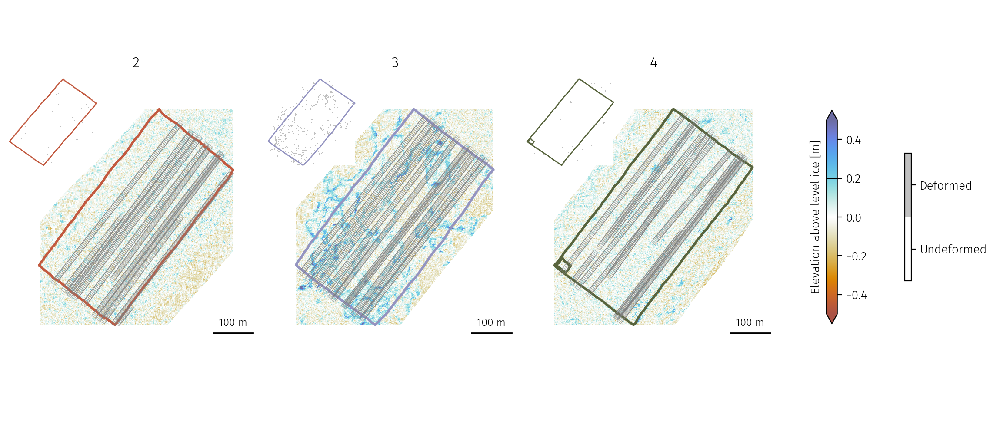

In [31]:
norm = mcolors.Normalize(vmin=-.5, vmax=.5)
colors =  ["#c25a40",
"#9494c1",
"#58643d"]
sites_2014 = [2,3,4]
fig, ax = plt.subplots(1,3,figsize=(11.5, 5), constrained_layout=True, dpi=200)   
ax = ax.ravel()
insets = [None]*len(ax)

for ind in range(len(ax)):
    ax[ind].set_aspect('equal')
    ax[ind].set_title(sites_2014[ind])
    ax[ind].axis('off')
    
    # if ind == 2:
    #     insets[ind] = ax[ind].inset_axes([0.7, 0.7, 0.3, 0.3])
    # else:
    insets[ind] = ax[ind].inset_axes([-0.05, 0.7, 0.4, 0.4])
    # insets[ind].set_xlim(0,.75)
    # insets[ind].set_ylim(0,20)
    # insets[ind].set_xlabel('Snow depth [m]', fontsize=9)
    # insets[ind].tick_params(axis='both', which='major', labelsize=9)

    # insets[ind].spines['top'].set_color('white')
    # insets[ind].spines['right'].set_color('white')
    # insets[ind].grid(ls=':',axis='y')
    insets[ind].axis('off')
    
for i, site in enumerate(sites_2014):
    # df_insitu = df_df.loc[df_df['site_id'] == site]
    
    for geom in shape_dict[site].geometry:
        if type(geom) == shapely.geometry.multipolygon.MultiPolygon:
            for j, g in enumerate(geom):
                ax[i].plot(g.exterior.xy[0], g.exterior.xy[1], color=colors[i], lw=2, zorder=100)
                insets[i].plot(g.exterior.xy[0], g.exterior.xy[1], color=colors[i], lw=1, zorder=100)
                
                            # ax[0].plot(shape_dict[site].geometry[0].geoms[0].exterior.xy[0], shape_dict[site].geometry[0].geoms[0].exterior.xy[1], color='black', lw=1, zorder=100, label='Site boundary')
        else:
                ax[i].plot(geom.exterior.xy[0], geom.exterior.xy[1], color=colors[i], lw=2, zorder=100, label='Site boundary')
                insets[i].plot(geom.exterior.xy[0], geom.exterior.xy[1], color=colors[i], lw=1, zorder=100, label='Site boundary')
    
    xlim = ax[i].get_xlim()
    
    width = xlim[1] - xlim[0]
    ylim = ax[i].get_ylim()
    height = ylim[1] - ylim[0]
    diff = height - width
    # ax[i].scatter(df_insitu['x'], df_insitu['y'], alpha=.1, s=1,color='grey')
    ATM_data_dict
    pcol = ax[i].pcolormesh(ATM_data_dict[site].easting.values, ATM_data_dict[site].northing.values, ATM_data_dict[site]['elevation'].values,
                     cmap=cmr.prinsenvlag,
                     norm=norm
                     )
    
    
    
    for fp, k in zip(df_master_dict[site]['footprints'], df_master_dict[site].index):
        plot_polygon(ax[i], fp, edgecolor='grey', facecolor='none', lw=.5, zorder=100, alpha=.5)
    
    if diff > 0:
        ax[i].set_xlim(xlim[0]-diff/2, xlim[1] + diff/2) 
        ax[i].set_ylim(ylim)
    else:
        ax[i].set_xlim(xlim)
        ax[i].set_ylim(ylim[0]-diff/2, ylim[1] + diff/2)


    insets[i].set_xlim(xlim)
    insets[i].set_ylim(ylim)
    pcol2 = insets[i].pcolormesh(ATM_data_dict[site].easting.values, ATM_data_dict[site].northing.values, ATM_data_dict[site]['classes'].values,
                         cmap=mcolors.ListedColormap(['white','silver']),
                        #  norm=mcolors.BoundaryNorm([0.5,1.5], ncolors=256, clip=False)
                         )   
    if site == 'grid5':
        # ax[i].text(0.0,0.3, text, ha='left', va='top', transform=ax[i].transAxes, size=8)
        scalebar = AnchoredSizeBar(ax[i].transData,
                           100, '100 m', 'lower left', 
                        #    pad=-1,
                           color='black',
                           frameon=False,
                           fill_bar=True,
                           size_vertical=2,
                           label_top=True,
                           sep=4,
                           fontproperties=font_manager.FontProperties(family='Fira Sans', size=9)
                           )

    else:    
        # ax[i].text(1.2, 0.19, text, ha='right', va='top', transform=ax[i].transAxes, size=8)
        scalebar = AnchoredSizeBar(ax[i].transData,
                           100, '100 m', 'lower right', 
                        #    pad=,
                           color='black',
                           frameon=False,
                           fill_bar=True,
                           size_vertical=2,
                           label_top=True,
                           sep=4,
                           fontproperties=font_manager.FontProperties(family='Fira Sans', size=9)
                           )
        
        
    ax[i].add_artist(scalebar)
    
    
    
# fig.tight_layout(h_pad=-25, w_pad=2)
cbar = fig.colorbar(pcol2, ax=ax, orientation='vertical', shrink=.3)
cbar.set_ticks([0.25,0.75])
cbar.set_ticklabels(['Undeformed', 'Deformed']) 

cbar = fig.colorbar(pcol, ax=ax, orientation='vertical', label='Elevation above level ice [m]', shrink=.5, extend='both')
cbar.ax.yaxis.set_label_position('left')
cbar.ax.axhline(0.2, color='black', lw=1)


    # ax[i].plot(shape_dict[site].geometry[0].exterior.xy[0],shape_dict[site].geometry[0].exterior.xy[1])

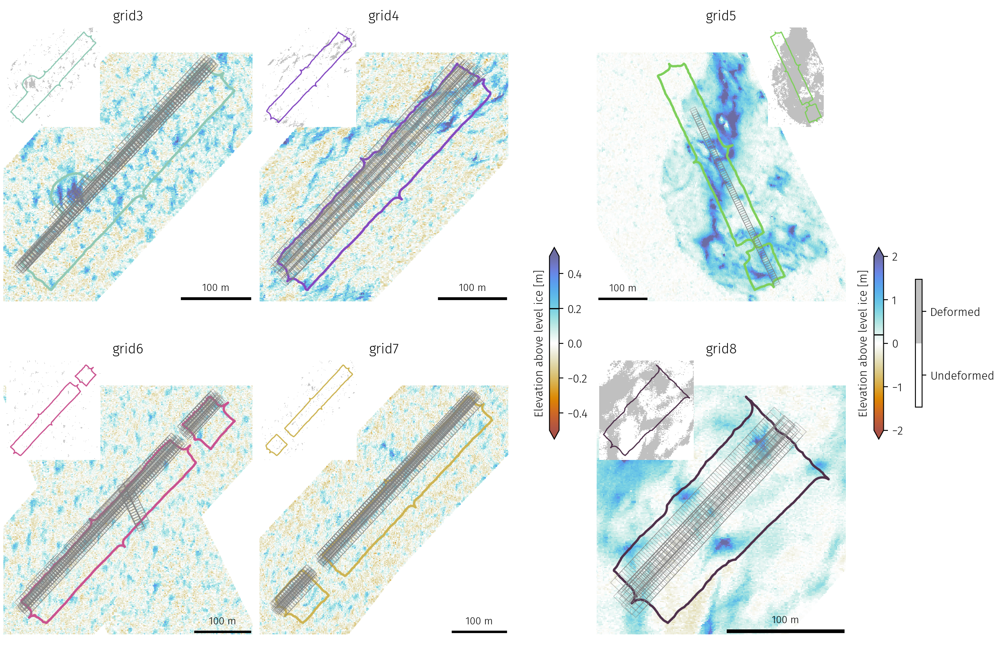

In [32]:
norm1_2 = mcolors.TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)
norm1_1 = mcolors.TwoSlopeNorm(vmin=-.5, vcenter=0, vmax=.5)

colors = ["#90c9b5",
"#8449c1",
"#7ecf5b",
"#ca5390",
"#cdb453","#4e304a",]
sites_2016 = ['grid3','grid4', 'grid5','grid6','grid7','grid8']
fig, ax = plt.subplots(2,3,figsize=(12,8), constrained_layout=True, dpi=200)   
ax = ax.ravel()
insets = [None]*len(ax)

for ind in range(len(ax)):
    ax[ind].set_aspect('equal')
    ax[ind].set_title(sites_2016[ind])
    ax[ind].axis('off')
    
    if ind == 2:
        insets[ind] = ax[ind].inset_axes([0.6, 0.7, 0.4, 0.4])
    else:
        insets[ind] = ax[ind].inset_axes([0, 0.7, 0.4, 0.4])
    # insets[ind].set_xlim(0,.75)
    # insets[ind].set_ylim(0,20)
    # insets[ind].set_xlabel('Snow depth [m]', fontsize=9)
    # insets[ind].tick_params(axis='both', which='major', labelsize=9)
    # insets[ind].spines['top'].set_color('white')
    # insets[ind].spines['right'].set_color('white')
    # insets[ind].grid(ls=':',axis='y')
    insets[ind].axis('off')
    insets[ind].set_aspect('equal')
    
for i, site in enumerate(sites_2016):
    # df_insitu = df_df.loc[df_df['site_id'] == site]
    
    for geom in shape_dict[site].geometry:
        if type(geom) == shapely.geometry.multipolygon.MultiPolygon:
            for j, g in enumerate(geom):
                ax[i].plot(g.exterior.xy[0], g.exterior.xy[1], color=colors[i], lw=2, zorder=100)
                insets[i].plot(g.exterior.xy[0], g.exterior.xy[1], color=colors[i], lw=1, zorder=100)
                
                            # ax[0].plot(shape_dict[site].geometry[0].geoms[0].exterior.xy[0], shape_dict[site].geometry[0].geoms[0].exterior.xy[1], color='black', lw=1, zorder=100, label='Site boundary')
        else:
                ax[i].plot(geom.exterior.xy[0], geom.exterior.xy[1], color=colors[i], lw=2, zorder=100, label='Site boundary')
                insets[i].plot(geom.exterior.xy[0], geom.exterior.xy[1], color=colors[i], lw=1, zorder=100, label='Site boundary')
    
    xlim = ax[i].get_xlim()
    
    width = xlim[1] - xlim[0]
    ylim = ax[i].get_ylim()
    height = ylim[1] - ylim[0]
    diff = height - width
    # ax[i].scatter(df_insitu['x'], df_insitu['y'], alpha=.1, s=1,color='grey')
    ATM_data_dict
    if site == 'grid5' or site == 'grid8':
        pcol1_2 = ax[i].pcolormesh(ATM_data_dict[site].easting.values, ATM_data_dict[site].northing.values, ATM_data_dict[site]['elevation'].values,
                        cmap=cmr.prinsenvlag,
                        norm=norm1_2
                        )
    else:
        pcol1_1 = ax[i].pcolormesh(ATM_data_dict[site].easting.values, ATM_data_dict[site].northing.values, ATM_data_dict[site]['elevation'].values,
                        cmap=cmr.prinsenvlag,
                        norm=norm1_1
                        )
    
    
    for fp, k in zip(df_master_dict[site]['footprints'], df_master_dict[site].index):
        plot_polygon(ax[i], fp, edgecolor='grey', facecolor='none', lw=.5, zorder=100, alpha=.5)
    
    if diff > 0:
        ax[i].set_xlim(xlim[0]-diff/2, xlim[1] + diff/2) 
        ax[i].set_ylim(ylim)
    else:
        ax[i].set_xlim(xlim)
        ax[i].set_ylim(ylim[0]-diff/2, ylim[1] + diff/2)


    insets[i].set_xlim(xlim)
    insets[i].set_ylim(ylim)
    pcol2 = insets[i].pcolormesh(ATM_data_dict[site].easting.values, ATM_data_dict[site].northing.values, ATM_data_dict[site]['classes'].values,
                         cmap=mcolors.ListedColormap(['white','silver']),
                        #  norm=mcolors.BoundaryNorm([0.5,1.5], ncolors=256, clip=False)
                         )    
    
    if site == 'grid5':
        # ax[i].text(0.0,0.3, text, ha='left', va='top', transform=ax[i].transAxes, size=8)
        scalebar = AnchoredSizeBar(ax[i].transData,
                           100, '100 m', 'lower left', 
                        #    pad=-1,
                           color='black',
                           frameon=False,
                           fill_bar=True,
                           size_vertical=2,
                           label_top=True,
                           sep=4,
                           fontproperties=font_manager.FontProperties(family='Fira Sans', size=9)
                           )

    else:    
        # ax[i].text(1.2, 0.19, text, ha='right', va='top', transform=ax[i].transAxes, size=8)
        scalebar = AnchoredSizeBar(ax[i].transData,
                           100, '100 m', 'lower right', 
                        #    pad=,
                           color='black',
                           frameon=False,
                           fill_bar=True,
                           size_vertical=2,
                           label_top=True,
                           sep=4,
                           fontproperties=font_manager.FontProperties(family='Fira Sans', size=9)
                           )
        
        
    ax[i].add_artist(scalebar)
    
    
    
# fig.tight_layout(h_pad=-25, w_pad=2)
cbar = fig.colorbar(pcol1_1, ax=ax[[0,1,3,4]], orientation='vertical', label='Elevation above level ice [m]', shrink=.3, extend='both')
cbar.ax.yaxis.set_label_position('left')
cbar.ax.axhline(0.2, color='black', lw=1)

cbar = fig.colorbar(pcol2, ax=ax[[2,5]], orientation='vertical', shrink=.2)
cbar.set_ticks([0.25,0.75])
cbar.set_ticklabels(['Undeformed', 'Deformed']) 
# 
cbar.ax.yaxis.set_label_position('left')

cbar = fig.colorbar(pcol1_2, ax=ax[[2,5]], orientation='vertical', label='Elevation above level ice [m]', shrink=.3, extend='both')
cbar.ax.yaxis.set_label_position('left')
cbar.ax.axhline(0.2, color='black', lw=1)

    # ax[i].plot(shape_dict[site].geometry[0].exterior.xy[0],shape_dict[site].geometry[0].exterior.xy[1])

Plot below, split into undeformed, deformed? Instead of measurement sites?

/var/folders/33/mb4rwg392ds1fw9l8rx1tnp80000gn/T/ipykernel_87196/590903175.py:170: UserWarning: The figure layout has changed to tight
  fig.tight_layout(h_pad=3, w_pad=4)


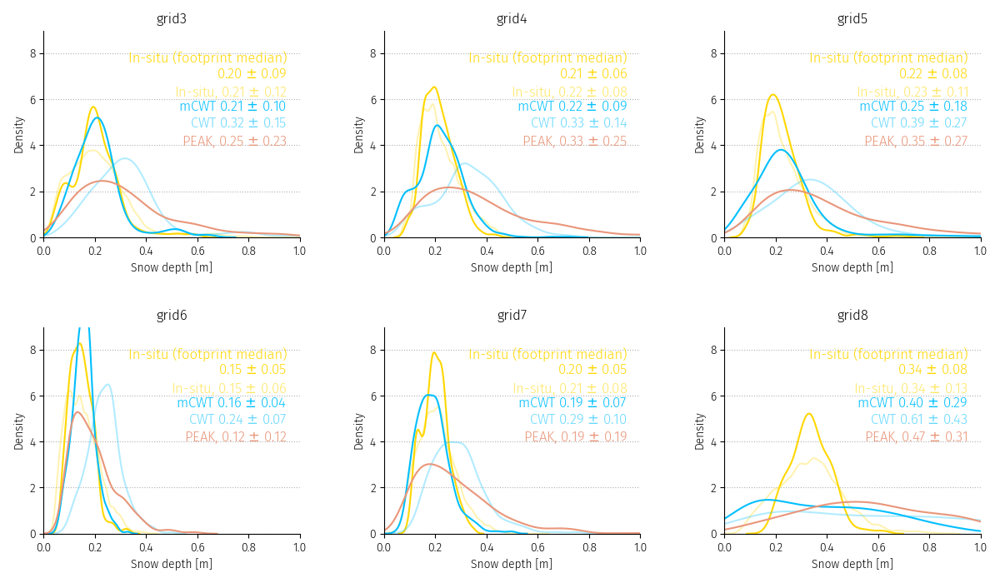

In [50]:
norm = mcolors.Normalize(vmin=0, vmax=1)
cmap = cmr.arctic
colors = ["#90c9b5",
"#8449c1",
"#7ecf5b",
"#ca5390",
"#cdb453","#4e304a",]
sites_2016 = ['grid3','grid4', 'grid5','grid6','grid7','grid8']

fig, ax = plt.subplots(2,3,figsize=(12,7), constrained_layout=True, dpi=100)   
ax = ax.ravel()

for ind in range(len(ax)):
    
    ax[ind].set_title(sites_2016[ind])
    ax[ind].spines['top'].set_color('white')
    ax[ind].spines['right'].set_color('white')
    ax[ind].grid(ls=':',axis='y')
    ax[ind].set_ylabel('Density')
    ax[ind].set_xlabel('Snow depth [m]')    
    ax[ind].set_xlim(0,1)
    ax[ind].set_ylim(0,9)

for i, site in enumerate(sites_2016):
    tst= [x for x in df_master_dict[site]['MP_snow_depth']]
    tst2 = np.concatenate(tst).ravel()

    sns.kdeplot(tst2,
                ax=ax[i],
                color='gold',
                alpha=.3
                )
    sns.kdeplot(df_master_dict[site]['MP_snow_depth'].apply(lambda x: np.nanmedian(x)),
                ax=ax[i],
                color='gold',
                )
    
    sns.kdeplot(df_master_dict[site]['snow_depth'] * 0.66,
                ax=ax[i],
                color='deepskyblue',
                )
    
    sns.kdeplot(df_master_dict[site]['snow_depth'],
                ax=ax[i],
                color='deepskyblue',
                alpha=.3
                )
    
    sns.kdeplot(df_master_dict[site].loc[df_master_dict[site]['snow_depth_peakiness'] > 0, 'snow_depth_peakiness'] ,
                ax=ax[i],
                color='darksalmon',
                )
    
    mcwt_mean = np.mean(df_master_dict[site]['snow_depth'] * 0.66)
    mcwt_std = np.std(df_master_dict[site]['snow_depth'] * 0.66)
    
    cwt_mean = np.mean(df_master_dict[site]['snow_depth'])
    cwt_std = np.std(df_master_dict[site]['snow_depth'])
      
    peak_mean = np.mean(df_master_dict[site]['snow_depth_peakiness'])
    peak_std = np.std(df_master_dict[site]['snow_depth_peakiness'])
    
    in_situ_footprint_mean = np.mean(df_master_dict[site]['MP_snow_depth'].apply(lambda x: np.nanquantile(x,.5)))
    in_situ_footprint_std = np.std(df_master_dict[site]['MP_snow_depth'].apply(lambda x: np.nanquantile(x,.5)))
    
    in_situ_mean = np.nanmean(tst2)
    in_situ_std = np.nanstd(tst2)
    
    # ax[i].axvline(np.nanmedian(df_master_dict[site]['snow_depth'] * 0.66),
    #               color='deepskyblue',
    #             #   alpha=.6,
    #               lw=1,
    #               )
    # ax[i].axvline(np.nanmedian(df_master_dict[site]['snow_depth']),
    #               color='deepskyblue',
    #               alpha=.3,
    #               lw=1,
    #               )
    
    # ax[i].axvline(np.nanmedian(df_master_dict[site]['snow_depth_peakiness']),
    #               color='darksalmon',
    #               lw=1,
    #               )
    
    # ax[i].axvline(np.mean(df_master_dict[site]['MP_snow_depth'].apply(lambda x: np.nanquantile(x,.5))),
    #               color='gold',
    #               lw=1,
    #               )
    
    # ax[i].axvline(np.mean(tst2),
    #             color='gold',
    #             lw=1,
    #             alpha=.3
    #             )

    text_cwt = f'{cwt_mean:.2f} $\pm$ {cwt_std:.2f}'
    text_mcwt = f'{mcwt_mean:.2f} $\pm$ {mcwt_std:.2f}'
    
    text_peak = f'{peak_mean:.2f} $\pm$ {peak_std:.2f}'
    text_in_situ = f'{in_situ_mean:.2f} $\pm$ {in_situ_std:.2f}'
    text_in_situ_footprint = f'{in_situ_footprint_mean:.2f} $\pm$ {in_situ_footprint_std:.2f}'
    
    ax[i].text(.95, .66, f'mCWT {text_mcwt}',
               transform=ax[i].transAxes,
               ha='right',
               va='top',
               fontsize=12,
               color='deepskyblue'
               )
    
    ax[i].text(.95, .58, f'CWT {text_cwt}',
               transform=ax[i].transAxes,
               ha='right',
               va='top',
               fontsize=12,
               color='deepskyblue',
               alpha=.6
               )
    
    ax[i].text(.95, .5, f'PEAK, {text_peak}',
               transform=ax[i].transAxes,
               ha='right',
               va='top',
               fontsize=12,
               color='darksalmon'
               )
    
    ax[i].text(.95, .9, f'In-situ (footprint median)\n{text_in_situ_footprint}',
               transform=ax[i].transAxes,
               ha='right',
               va='top',
               fontsize=12,
               color='gold'
               )
    
    ax[i].text(.95, .74, f'In-situ, {text_in_situ}',
               transform=ax[i].transAxes,
               ha='right',
               va='top',
               fontsize=12,
               color='gold',
               alpha=.6
               )
    # sns.histplot(tst2,
    #              ax=ax[i],
    #              color=colors[i],
    #              bins=np.arange(0,1,.05),
    #              stat='density',
    #              alpha=.3,
    #              label='In-situ'
    #              )
    # sns.histplot(df_master_dict[site].loc[df_master_dict[site]['snow_depth_peakiness'] > 0, 'snow_depth_peakiness'] ,
    #              ax=ax[i],
    #              color=colors[i],
    #              bins=np.arange(0,1,.05),
    #              stat='density',
    #              alpha=.3,
                #  label='In-situ'
                #  )
    
    # sns.histplot(df_master_dict[site]['snow_depth'],
    #              ax=ax[i],
    #              color=colors[i],
    #              bins=np.arange(0,1,.05),
    #              stat='density',
    #              label='CWT'
    #              )
    # ax[i].legend(frameon=False, loc='upper right', bbox_to_anchor=(1.3,1))
    
fig.tight_layout(h_pad=3, w_pad=4)